# `find_and_suppress` on MIDOG++ — first single-pass run

**The question.** MIDOG++ annotates every mitotic figure inside a ~2 mm² ROI. So we can
hand the algorithm *one* of those annotations, let it search the rest of the ROI, and score
every detection against the ground truth we held back. How far does one human click get you?

**Scope of this run.** One image per tumour domain (7), one randomly-chosen mitotic-figure
seed each, a single forward pass. No iterative bootstrapping, no multi-seed variance
estimate, no hematoxylin variant — those are implemented but not run here.

All logic lives in [`midog_utils/`](midog_utils/); this notebook only calls it.

In [1]:
import sys, time
sys.path.insert(0, '..') if 'midog_utils' not in __import__('os').listdir('.') else None

import numpy as np, pandas as pd, matplotlib.pyplot as plt

from midog_utils import dataset as ds, channels as ch, template_match as tm
from midog_utils import find_and_suppress as fs, evaluate as ev, experiment as ex, viz

pd.set_option('display.width', 200); pd.set_option('display.max_columns', 60)

images, annotations = ds.load_annotations('databases/MIDOG++.json')
ds.check_invariants(annotations)          # every bbox is 50x50 and TLBR, or this raises
print(f'{len(images)} annotated images, {len(annotations)} annotations')
print(annotations.category_id.map(ds.CATEGORY_NAMES).value_counts().to_string())

503 annotated images, 26286 annotations
category_id
not mitotic figure    14349
mitotic figure        11937


## The coordinate gate

Multiscale + rotation means a response-map peak has to be mapped back to image coordinates
using **half of its own template's size** — a 31 px template yields an `(H-30, W-30)` map and
a 51 px template an `(H-50, W-50)` map, and each has to be shifted before the maps are fused.

Getting this wrong shifts every detection by 10–25 px, which at a ~33 px match radius destroys
recall and presents as *"template matching doesn't work on H&E"* rather than as a bug. So each
augmentation is planted into a noise canvas at a known centre and the peak of the **fused** map
has to come back within 1 px. Nothing runs on a real image until this passes.

In [2]:
rng = np.random.default_rng(0)
yy, xx = np.mgrid[-36:37, -36:37]
probe = (200*np.exp(-((xx/9.0)**2 + (yy/22.0)**2)) + rng.normal(0, 4, (73, 73))).astype(np.float32)

templates, metas = tm.build_augmentations(probe, scales=(0.6, 0.8, 1.0), n_angles=12, flips=(False, True))
recovered = tm.plant_and_recover(templates, metas, canvas=257, tolerance=1.0)

offsets = np.array([(dx, dy) for _, dx, dy, _ in recovered])
print(f'{len(templates)} augmentations, sizes {sorted({t.shape[0] for t in templates})}')
print(f'GATE PASSED: max |dx| = {abs(offsets[:,0]).max()} px, max |dy| = {abs(offsets[:,1]).max()} px')

72 augmentations, sizes [31, 41, 51]
GATE PASSED: max |dx| = 0 px, max |dy| = 0 px


## Which images

One ROI per tumour domain: the downloaded image with the most mitotic figures, ties to the
lower id. Maximising category-1 count matters at this sample size — with one seed held out,
an image with 4 mitotic figures leaves an evaluation set of 3.

The rule also drops `001.tiff` on its own: it has **zero** category-1 annotations (4 look-alikes
only), so it cannot be seeded with a mitotic figure at all.

In [3]:
selection = ex.select_domain_images(images, annotations)
counts = (annotations.groupby(['file_name', 'category_id']).size().unstack(fill_value=0)
            .rename(columns=ds.CATEGORY_NAMES))
selection.merge(counts, left_on='file_name', right_index=True)

,tumor_type,image_id,file_name,width,height,n_mitotic,mitotic figure,not mitotic figure
0,canine cutaneous mast cell tumor,301,301.tiff,6447,4835,218,218,109
1,canine lung cancer,201,201.tiff,6577,4933,18,18,49
2,canine lymphosarcoma,246,246.tiff,6577,4933,116,116,123
3,canine soft tissue sarcoma,405,405.tiff,6577,4933,14,14,19
4,human breast cancer,2,002.tiff,7215,5412,9,9,7
5,human melanoma,506,506.tiff,7215,5412,12,12,12
6,human neuroendocrine tumor,350,350.tiff,7215,5412,4,4,16


## Configuration

Departures from `bbox tuning code reference/bbox_tuning.py` that change results rather than style:

| | reference | here | why |
|---|---|---|---|
| rotations | dead — `shortlist_augmentations` overwrites the rotated template with the unrotated one, so all rotations collapse to one | 12 real angles × 2 flips | mitotic figures have no canonical orientation |
| scales | `0.5 … 2.0` | **single scale, 51 px** | see below — multi-scale fusion was measured and rejected |
| NMS order | by `x top left`; the match score is computed then dropped | score-ordered | otherwise the survivor of a cluster is just the right-most one, and there is no score left to rank or threshold with |
| existing annotations | blacked out before correlating | untouched; the seed's own hit dropped afterwards | black holes give `TM_CCOEFF_NORMED` zero-variance windows and hard edges to correlate against |
| refine / stability / AR / PSNR filters | on | off | evaluation is point-based, and the stability check passes 0/9 objects on H&E (see the bbox-tuning research log) |

**Why a single 51 px template rather than a scale pyramid.** `TM_CCOEFF_NORMED` is a
correlation over the template's pixels, so a *smaller* template has a wider null distribution
and produces a higher maximum by chance. Taking a raw element-wise max across 31 / 41 / 51 px
therefore hands the win to the smallest template — measured at 95% of top-K detections.

Reading the response map directly at annotated locations on 002.tiff shows what that costs
(AUC = P(a random mitotic figure outscores a random ordinary nucleus); higher is better):

| fusion | templates | AUC mitosis | AUC look-alike | median mitosis rank |
|---|---:|---:|---:|---:|
| max over 31/41/51 px | 72 | 0.906 | 0.869 | 806 |
| z-normalised max over 31/41/51 px | 72 | 0.928 | 0.886 | 619 |
| **51 px only** | **24** | **0.940** | 0.904 | **518** |
| 31 px only | 24 | 0.836 | 0.725 | 1413 |

The single 51 px template — the annotation box itself — wins on this image and costs a third
of the compute, which is why it is the default. **Caveat: this table is one image.**
`results/fs_fusion_variants.csv` also holds 246.tiff, where `fused_z_normalised` beats it on
raw AUC (0.866 vs 0.853) and rank (2672 vs 2933) — single-scale wins there only on the
mitosis-vs-look-alike gap (+0.061 vs +0.032). The two criteria disagree, and so do the two
images. Multi-scale remains available via `FSConfig(scales=...)`.

In [4]:
cfg = fs.FSConfig()
print(cfg)
print(f'\n{cfg.n_augmentations} augmentations per run '
      f'({cfg.n_angles} rotations x {len(cfg.flips)} flips x {len(cfg.scales)} scale)')

FSConfig(channel='gray_inverted', base_size=51, patch_size=73, scales=(1.0,), n_angles=12, flips=(False, True), peak_min_distance=7, score_threshold=0.25, max_peaks=250000, nms_radius=25.0, self_hit_radius=5.0, max_detections=1000000000, scale_normalize=False)

24 augmentations per run (12 rotations x 2 flips x 1 scale)


## Run

~70 s per image end to end: 30–105 s (mean 54) for the 24 correlations over a
~35-megapixel ROI, plus the nucleus-blob baseline. 481 s for the seven-image sweep.

In [5]:
t0 = time.time()
results, metrics, detections = ex.run_experiment(selection, annotations, cfg=cfg, seed=0)
print(f'\ntotal {time.time()-t0:.0f}s')

metrics.to_csv('results/fs_metrics.csv', index=False)
detections.to_csv('results/fs_detections.csv', index=False)

=== 301.tiff  (canine cutaneous mast cell tumor, 218 mitotic) 


    recall@K=0.097  attraction@K=0.046  (44s)


=== 201.tiff  (canine lung cancer, 18 mitotic) 


    recall@K=0.059  attraction@K=0.020  (121s)


=== 246.tiff  (canine lymphosarcoma, 116 mitotic) 


    recall@K=0.191  attraction@K=0.065  (56s)


=== 405.tiff  (canine soft tissue sarcoma, 14 mitotic) 


    recall@K=0.077  attraction@K=0.000  (55s)


=== 002.tiff  (human breast cancer, 9 mitotic) 


    recall@K=0.125  attraction@K=0.143  (67s)


=== 506.tiff  (human melanoma, 12 mitotic) 


    recall@K=0.000  attraction@K=0.083  (90s)


=== 350.tiff  (human neuroendocrine tumor, 4 mitotic) 


    recall@K=0.000  attraction@K=0.000  (47s)



total 481s


## Results

### Headline: `recall@K`

`K` = the number of mitotic figures in that ROI, minus the seed. *"Given a detection budget
equal to the true mitosis count, how many does one template find?"*

It is threshold-free on purpose. The number of `TM_CCOEFF_NORMED` peaks above any fixed score
differs by orders of magnitude between a dense domain like lymphosarcoma and a sparse one like
melanoma, so precision at a fixed threshold is not comparable across the table.

In [6]:
ex.summary_table(metrics)

,tumor_type,file_name,method,n_gt_mitotic_eval,n_lookalike_gt,recall_at_k,lookalike_attraction_at_k,topk_tp,topk_fp_lookalike,topk_fp_unannotated,sens@8fp_mm2,sens@64fp_mm2,mitotic_recall,lookalike_attraction,n_detections_total,recall_unanimous,recall_contested
0,canine cutaneous mast cell tumor,301.tiff,find_and_suppress,217,109,0.096774,0.045872,21,5,191,0.013825,0.059908,1.0,0.990826,20031,1.0,1.0
1,canine lung cancer,201.tiff,find_and_suppress,17,49,0.058824,0.020408,1,1,15,0.058824,0.117647,1.0,1.000000,19492,1.0,1.0
2,canine lymphosarcoma,246.tiff,find_and_suppress,115,123,0.191304,0.065041,22,8,85,0.095652,0.191304,1.0,1.000000,23143,1.0,1.0
3,canine soft tissue sarcoma,405.tiff,find_and_suppress,13,19,0.076923,0.000000,1,0,12,0.076923,0.076923,1.0,1.000000,13370,1.0,1.0
4,human breast cancer,002.tiff,find_and_suppress,8,7,0.125000,0.142857,1,1,6,0.375000,0.625000,1.0,1.000000,16605,1.0,1.0
5,human melanoma,506.tiff,find_and_suppress,11,12,0.000000,0.083333,0,1,10,0.000000,0.272727,1.0,0.916667,18928,1.0,1.0
6,human neuroendocrine tumor,350.tiff,find_and_suppress,3,16,0.000000,0.000000,0,0,3,0.000000,0.333333,1.0,1.000000,20313,NaN,1.0


### Is it finding mitoses, or just dark chromatin?

`lookalike_attraction_at_k` is the fraction of category-2 annotations — structures a
pathologist looked at and **rejected** — claimed by the same top-K detections. Same budget as
`recall_at_k`, so the two are directly comparable.

If they are similar, the matcher is not discriminating mitosis from mimic.

In [7]:
cmp = metrics[metrics.method == 'find_and_suppress'][
    ['tumor_type', 'file_name', 'n_gt_mitotic_eval', 'n_lookalike_gt',
     'recall_at_k', 'lookalike_attraction_at_k', 'mitotic_recall', 'lookalike_attraction']
].sort_values('tumor_type').reset_index(drop=True)
cmp['ratio_recall_over_attraction'] = (cmp.recall_at_k / cmp.lookalike_attraction_at_k.replace(0, np.nan)).round(2)
cmp

,tumor_type,file_name,n_gt_mitotic_eval,n_lookalike_gt,recall_at_k,lookalike_attraction_at_k,mitotic_recall,lookalike_attraction,ratio_recall_over_attraction
0,canine cutaneous mast cell tumor,301.tiff,217,109,0.096774,0.045872,1.0,0.990826,2.11
1,canine lung cancer,201.tiff,17,49,0.058824,0.020408,1.0,1.000000,2.88
2,canine lymphosarcoma,246.tiff,115,123,0.191304,0.065041,1.0,1.000000,2.94
3,canine soft tissue sarcoma,405.tiff,13,19,0.076923,0.000000,1.0,1.000000,NaN
4,human breast cancer,002.tiff,8,7,0.125000,0.142857,1.0,1.000000,0.88
5,human melanoma,506.tiff,11,12,0.000000,0.083333,1.0,0.916667,0.00
6,human neuroendocrine tumor,350.tiff,3,16,0.000000,0.000000,1.0,1.000000,NaN


### Against the baselines

`nucleus_blobs` is the *"any dark blob"* comparator: hematoxylin channel → tiled Otsu →
connected components → area filter → centroids, ranked by mean chromatin intensity.
`random_in_tissue` is the floor — random points restricted to tissue, because uniform points
over the ROI would land in white space and make any lift look impressive.

If one-shot template matching does not beat the blob detector, that is the finding.

In [8]:
pivot = metrics.pivot_table(index=['tumor_type', 'file_name'], columns='method',
                            values='recall_at_k').round(3)
pivot['lift_vs_blobs'] = (pivot['find_and_suppress'] /
                          pivot['nucleus_blobs'].replace(0, np.nan)).round(2)
pivot

,method,find_and_suppress,nucleus_blobs,random_in_tissue,lift_vs_blobs
tumor_type,file_name,,,,
canine cutaneous mast cell tumor,301.tiff,0.097,0.599,0.005,0.16
canine lung cancer,201.tiff,0.059,0.235,0.000,0.25
canine lymphosarcoma,246.tiff,0.191,0.357,0.000,0.54
canine soft tissue sarcoma,405.tiff,0.077,0.077,0.000,1.00
human breast cancer,002.tiff,0.125,0.000,0.000,NaN
human melanoma,506.tiff,0.000,0.000,0.000,NaN
human neuroendocrine tumor,350.tiff,0.000,0.000,0.000,NaN


The `recall@K` table above is already an equal-budget comparison. This second one is at a
much looser budget: full lists for the matcher, and the blob detector truncated to the same
number of candidates the matcher produced.

In [9]:
budget = metrics[metrics.method == 'nucleus_blobs'][
    ['file_name', 'matcher_budget', 'mitotic_recall_at_matcher_budget']].set_index('file_name')
matcher = metrics[metrics.method == 'find_and_suppress'][
    ['tumor_type', 'file_name', 'mitotic_recall']].set_index('file_name')
eq = matcher.join(budget).rename(columns={
    'mitotic_recall': 'find_and_suppress',
    'mitotic_recall_at_matcher_budget': 'nucleus_blobs'})
eq[['find_and_suppress', 'nucleus_blobs']] = eq[['find_and_suppress', 'nucleus_blobs']].round(3)
eq.sort_values('tumor_type')

,tumor_type,find_and_suppress,matcher_budget,nucleus_blobs
file_name,,,,
301.tiff,canine cutaneous mast cell tumor,1.0,20031.0,0.986
201.tiff,canine lung cancer,1.0,19492.0,1.000
246.tiff,canine lymphosarcoma,1.0,23143.0,0.983
405.tiff,canine soft tissue sarcoma,1.0,13370.0,1.000
002.tiff,human breast cancer,1.0,16605.0,0.875
506.tiff,human melanoma,1.0,18928.0,1.000
350.tiff,human neuroendocrine tumor,1.0,20313.0,1.000


In [10]:
full = metrics.pivot_table(index=['tumor_type', 'file_name'], columns='method',
                           values='mitotic_recall').round(3)
full.columns = [f'{c}_full_list' for c in full.columns]
n_det = metrics.pivot_table(index=['tumor_type', 'file_name'], columns='method',
                            values='n_detections_total')
n_det.columns = [f'n_{c}' for c in n_det.columns]
full.join(n_det)

,,find_and_suppress_full_list,nucleus_blobs_full_list,random_in_tissue_full_list,n_find_and_suppress,n_nucleus_blobs,n_random_in_tissue
tumor_type,file_name,,,,,,
canine cutaneous mast cell tumor,301.tiff,1.0,0.986,0.571,20031.0,20000.0,20031.0
canine lung cancer,201.tiff,1.0,1.000,0.882,19492.0,13275.0,19492.0
canine lymphosarcoma,246.tiff,1.0,0.983,0.887,23143.0,20000.0,23143.0
canine soft tissue sarcoma,405.tiff,1.0,1.000,0.923,13370.0,7076.0,13370.0
human breast cancer,002.tiff,1.0,0.875,1.000,16605.0,8604.0,16605.0
human melanoma,506.tiff,1.0,1.000,0.636,18928.0,9241.0,18928.0
human neuroendocrine tumor,350.tiff,1.0,1.000,1.000,20313.0,9322.0,20313.0


## Every detection, not just the top K

`recall@K` deliberately imposes a budget. This drops it: **every** detection the search
returned, bucketed by what it landed on.

> **Read this table with care.** At the 0.25 score floor the list is dense enough that
> **91–97% of the ROI lies within a match radius of some detection**, so "was this
> annotation found" is largely answered by geometry rather than by the response map. The
> `random_in_tissue` control reaches full-list mitotic recall of 1.000 on 002.tiff and
> 350.tiff. Treat `all_mitotic_gt_found` as a coverage statistic, not a detection result,
> and read the threshold sweep below instead — coverage falls to ~4% at 0.60 on 301.tiff.

The precision column is likewise a property of the 0.25 floor, not of the method: at
threshold 0.70 the list is 1 detection on 301.tiff and 2 601 on 405.tiff.

In [11]:
ex.full_list_table(metrics)

,tumor_type,file_name,all_n_detections,all_tp,all_fp_lookalike,all_fp_unannotated,all_matched_any_gt,all_matched_frac,all_precision_mitotic,all_mitotic_gt_found,all_mitotic_gt_missed,all_lookalike_gt_found,all_lookalike_gt_missed
0,canine cutaneous mast cell tumor,301.tiff,20031,217,108,19706,325,0.016225,0.010833,217,0,108,1
1,canine lung cancer,201.tiff,19492,17,49,19426,66,0.003386,0.000872,17,0,49,0
2,canine lymphosarcoma,246.tiff,23143,115,123,22905,238,0.010284,0.004969,115,0,123,0
3,canine soft tissue sarcoma,405.tiff,13370,13,19,13338,32,0.002393,0.000972,13,0,19,0
4,human breast cancer,002.tiff,16605,8,7,16590,15,0.000903,0.000482,8,0,7,0
5,human melanoma,506.tiff,18928,11,11,18906,22,0.001162,0.000581,11,0,11,1
6,human neuroendocrine tumor,350.tiff,20313,3,16,20294,19,0.000935,0.000148,3,0,16,0


`all_matched_frac` is the fraction of detections that landed on *any* annotation, mitotic
or look-alike. `all_precision_mitotic` counts only mitotic hits.

`all_mitotic_gt_missed` is 0 on every image — but per the caveat above that is a
consequence of coverage saturation at this score floor, not evidence the method detects
everything. The equivalent number for uniform random points is also 0 on two of the ROIs.

Note also that `nucleus_blobs` is capped at 20 000 detections, which **binds** on 301.tiff
and 246.tiff, so its `matcher_budget` column overstates what was actually delivered.

### Where the score floor sits

"Everything that was found" is only meaningful relative to the score threshold the search ran
at (0.25 here). This makes that dependence explicit rather than leaving it buried in a config
value.

In [12]:
sweeps = []
for fn, res in results.items():
    sw = ev.threshold_sweep(res['detections'], res['gt_eval'])
    sw.insert(0, 'file_name', fn)
    sweeps.append(sw)
sweeps = pd.concat(sweeps, ignore_index=True)
sweeps.to_csv('results/fs_threshold_sweep.csv', index=False)
sweeps

,file_name,score_threshold,n_detections,tp,fp_lookalike,fp_unannotated,precision,recall,f1
0,301.tiff,0.25,20031,217,108,19706,0.0108,1.0000,0.0214
1,301.tiff,0.40,16724,213,105,16406,0.0127,0.9816,0.0251
2,301.tiff,0.50,7538,177,78,7283,0.0235,0.8157,0.0456
3,301.tiff,0.60,404,30,7,367,0.0743,0.1382,0.0966
4,301.tiff,0.70,1,0,0,1,0.0000,0.0000,0.0000
5,301.tiff,0.80,0,0,0,0,0.0000,0.0000,0.0000
6,301.tiff,0.90,0,0,0,0,0.0000,0.0000,0.0000
7,201.tiff,0.25,19492,17,49,19426,0.0009,1.0000,0.0017
8,201.tiff,0.40,14166,17,49,14100,0.0012,1.0000,0.0024
9,201.tiff,0.50,5921,16,48,5857,0.0027,0.9412,0.0054


## Why so few true positives

Detection metrics conflate two separate questions: whether the response map carries any signal
at all, and whether the ranking can surface that signal against the base rate. This reads the
map directly at annotated locations to separate them.

`auc_mitosis_vs_nucleus` is P(a random mitotic figure outscores a random ordinary nucleus).
0.5 = no signal. `median_mitosis_rank` = `(1 - AUC) x n_nuclei` is roughly where the typical
mitotic figure lands in a ranking of every nucleus in the ROI — compare it against `K`.

In [13]:
probe = pd.DataFrame([
    ex.score_probe(fn, annotations,
                   int(metrics.loc[(metrics.file_name == fn) &
                                   (metrics.method == 'find_and_suppress'), 'seed_ann_id'].iloc[0]),
                   cfg=cfg)
    for fn in ['002.tiff', '246.tiff']
])
probe.to_csv('results/fs_score_probe.csv', index=False)
probe.T

,0,1
file_name,002.tiff,246.tiff
n_mitotic,8,115
n_nuclei,8604,20000
mitotic_base_rate_pct,0.093,0.575
seed_self_score,1.0,1.0
median_score_mitotic,0.7558,0.5064
median_score_lookalike,0.7101,0.4475
median_score_nucleus,0.4911,0.3205
median_score_random,0.308,0.2755
p90_mitotic,0.7882,0.6482


Three things to read off:

1. **The map has signal.** Mitotic figures score above ordinary nuclei, which score above
   random tissue. AUC is well clear of 0.5.
2. **The signal is not mitosis-specific.** `auc_lookalike_vs_nucleus` sits at essentially the
   same value — correlating against a chromatin template measures *"dark, compact, similar
   texture"*, which is exactly what makes a look-alike a look-alike.
3. **The base rate is the killer.** Mitotic figures are a fraction of a percent of the nuclei
   in a 2 mm² ROI. `median_mitosis_rank` versus `K` shows the shortfall directly, and
   `p90_mitotic` versus `p99.9_nucleus` shows why: the top 0.1% of *ordinary* nuclei outscore
   90% of mitotic figures, and the top 0.1% is about the size of the whole top-K budget.

### FROC

Sensitivity against false positives per mm². Both false-positive buckets count against the
mitosis task here — a look-alike hit is still a wrong answer, the bucket split just says *what
kind* of wrong. ROIs are ~2 mm², so this axis is directly comparable to the MIDOG literature.

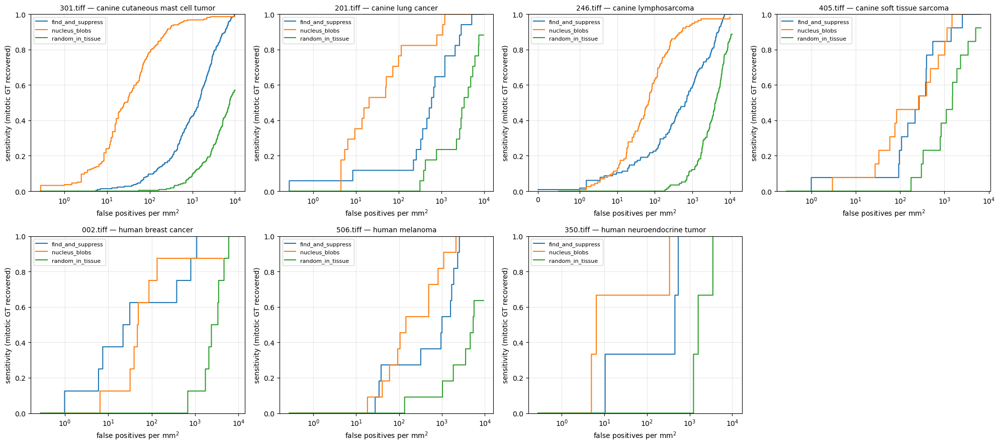

In [14]:
fig, axes = plt.subplots(2, 4, figsize=(20, 9))
for ax, (fn, res) in zip(axes.ravel(), results.items()):
    curves = [('find_and_suppress', *res['curve'])]
    if 'baseline_blobs_curve' in res:
        curves.append(('nucleus_blobs', *res['baseline_blobs_curve']))
        curves.append(('random_in_tissue', *res['baseline_random_curve']))
    tumor = selection.loc[selection.file_name == fn, 'tumor_type'].iloc[0]
    viz.froc_plot(curves, ax=ax, title=f'{fn} — {tumor}')
for ax in axes.ravel()[len(results):]:
    ax.axis('off')
fig.tight_layout(); plt.show()

### Where the detections land

White star = the seed. Red = ground-truth mitotic figures, yellow = ground-truth look-alikes.
Detections are the top-K only, coloured by bucket.

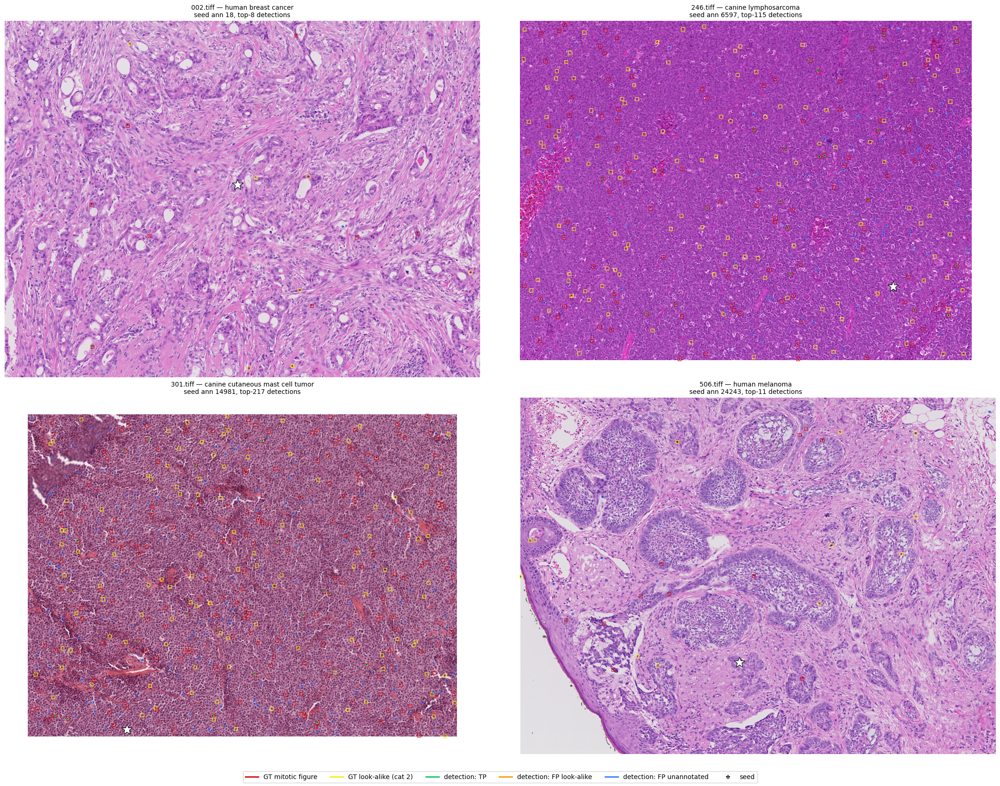

In [15]:
show = ['002.tiff', '246.tiff', '301.tiff', '506.tiff']
fig, axes = plt.subplots(2, 2, figsize=(22, 17))
for ax, fn in zip(axes.ravel(), show):
    res = results[fn]                       # detections are already computed; only the pixels are reloaded
    rgb = ds.load_roi(f'images/{fn}')
    k = res['metrics'][0]['k']
    tumor = selection.loc[selection.file_name == fn, 'tumor_type'].iloc[0]
    viz.overlay(rgb, res['gt'], res['detections'], (res['seed'].cx, res['seed'].cy),
                ax=ax, downsample=4, top_n=k,
                title=f"{fn} — {tumor}\nseed ann {int(res['seed'].ann_id)}, top-{k} detections")
    del rgb
fig.legend(handles=viz.legend_handles(), loc='lower center', ncol=6, fontsize=10)
fig.tight_layout(rect=(0, 0.03, 1, 1)); plt.show()

### Expert-agreement split

MIDOG++ keeps the per-rater votes in `labels`, so mitotic recall splits for free into
annotations every expert agreed on versus ones they argued about. It separates *"missed an
obvious mitosis"* from *"missed a borderline call"*.

In [16]:
metrics[metrics.method == 'find_and_suppress'][
    ['tumor_type', 'file_name', 'n_unanimous', 'recall_unanimous', 'n_contested', 'recall_contested']
].sort_values('tumor_type').reset_index(drop=True)

,tumor_type,file_name,n_unanimous,recall_unanimous,n_contested,recall_contested
0,canine cutaneous mast cell tumor,301.tiff,163,1.0,54,1.0
1,canine lung cancer,201.tiff,7,1.0,10,1.0
2,canine lymphosarcoma,246.tiff,100,1.0,15,1.0
3,canine soft tissue sarcoma,405.tiff,10,1.0,3,1.0
4,human breast cancer,002.tiff,6,1.0,2,1.0
5,human melanoma,506.tiff,7,1.0,4,1.0
6,human neuroendocrine tumor,350.tiff,0,NaN,3,1.0


### Greedy vs optimal matching

Detections are matched to ground truth greedily in descending score, once. That is deliberate:
optimal assignment recomputed at each threshold can re-assign earlier detections and produce a
non-monotone FROC, where *lowering* the threshold decreases sensitivity.

Globally the closest two MIDOG++ annotations are 26.25 px apart, below the ~33 px match radius.
But **within these seven ROIs the minimum spacing is 40.7 px**, above both the match radius and
the 25 px NMS radius — so the ambiguity cannot arise in this run and the check below is vacuous
as configured. It returns 0 disagreements for that reason, not as a validation.

In [17]:
rows = []
for fn, res in results.items():
    k = res['metrics'][0]['k']
    rows.append({'file_name': fn,
                 **ev.optimal_assignment_disagreement(res['detections'].head(k), res['gt_eval'], res['radius'])})
pd.DataFrame(rows)

,file_name,greedy_matches,optimal_matches,disagreements
0,301.tiff,26,26,0
1,201.tiff,2,2,0
2,246.tiff,30,30,0
3,405.tiff,1,1,0
4,002.tiff,2,2,0
5,506.tiff,1,1,0
6,350.tiff,0,0,0
